# Kaggle

In [ ]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download -d saqialii/dfd-input

 82% 73.0M/88.6M [00:00<00:00, 91.0MB/s]
100% 88.6M/88.6M [00:00<00:00, 97.4MB/s]


In [ ]:
!unzip dfd-input.zip

Archive:  dfd-input.zip
  inflating: pix2pix-depth/pix2pix-depth/testing/1351.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1352.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1353.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1354.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1355.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1356.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1357.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1358.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1359.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1360.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1361.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1362.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1363.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1364.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1365.jpg  
  inflating: pix2pix-depth/pix2pix-depth/testing/1366.jpg  
  inflating: pix

# Importing Dependices

In [ ]:
import torch
from torch import nn
from torchvision import transforms

In [ ]:
from torch.utils.data import DataLoader
from PIL import Image
# from typing import List, Tuple, Dict
import os
from glob import glob
import numpy as np
# from statistics import mean
from tqdm import tqdm
from torchvision.utils import save_image

In [ ]:
# try:
#     import gradio as gr
# except:
#     !pip install -q gradio
#     import gradio as gr

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
# !unzip pix2pix-depth.zip

# Creating Dataset

In [ ]:
def show_img_sample(img: torch.Tensor, img1: torch.Tensor):
    fig, axes = plt.subplots(1, 2, figsize=(15, 8))
    ax = axes.ravel()
    ax[0].imshow(img.permute(1, 2, 0))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title("input image", c="g")
    ax[1].imshow(img1.permute(1, 2, 0))
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_title("label image", c="g")
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

In [ ]:
data_transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5,), (0.5, 0.5, 0.5,))
        ])

In [ ]:
def read_path(filepath):
    root_path = "pix2pix-depth/pix2pix-depth"
    path = os.path.join(root_path, filepath)
    dataset = []
    for p in glob(path+"/"+"*.jpg"):
        dataset.append(p)
    return dataset

In [ ]:
TRAIN_DIR = "pix2pix-depth/training"
VAL_DIR = "pix2pix-depth/validation"
class Dataset(object):
    def __init__(self, files):
        self.files = files
        self.trasformer = data_transform

    def _separate(self, img):
        img = np.array(img, dtype=np.uint8)
        h, w, _ = img.shape
        w = int(w/2)
        return Image.fromarray(img[:, w:, :]), Image.fromarray(img[:, :w, :])

    def __getitem__(self, idx: int):
        img = Image.open(self.files[idx])
        output,input = self._separate(img)
        input_tensor = self.trasformer(input)
        output_tensor = self.trasformer(output)
        return input_tensor, output_tensor

    def __len__(self):
        return len(self.files)

In [ ]:
# class CreateDataset(Dataset):
#     def __init__(self, root_dir):
#         self.root_dir = root_dir
#         self.list_files = os.listdir(self.root_dir)

#     def __len__(self):
#         return len(self.list_files)

#     def __getitem__(self, index):
#         img_file = self.list_files[index]
#         img_path = os.path.join(self.root_dir, img_file)
#         image = np.array(Image.open(img_path))
#         input_image = image[:, :600, :]
#         target_image = image[:, 600:, :]

#         augmentations = both_transform(image=input_image, image0=target_image)
#         input_image = augmentations["image"]
#         target_image = augmentations["image0"]

#         input_image = transform_only_input(image=input_image)["image"]
#         target_image = transform_only_mask(image=target_image)["image"]

#         return input_image, target_image

In [ ]:
train_files=read_path('training')
# train_files=train_files[:1000]
dataset = Dataset(train_files)
# loader = DataLoader(dataset, batch_size=5)

In [ ]:
print(len(train_files))

1351


In [ ]:
x,y=dataset.__getitem__(10)

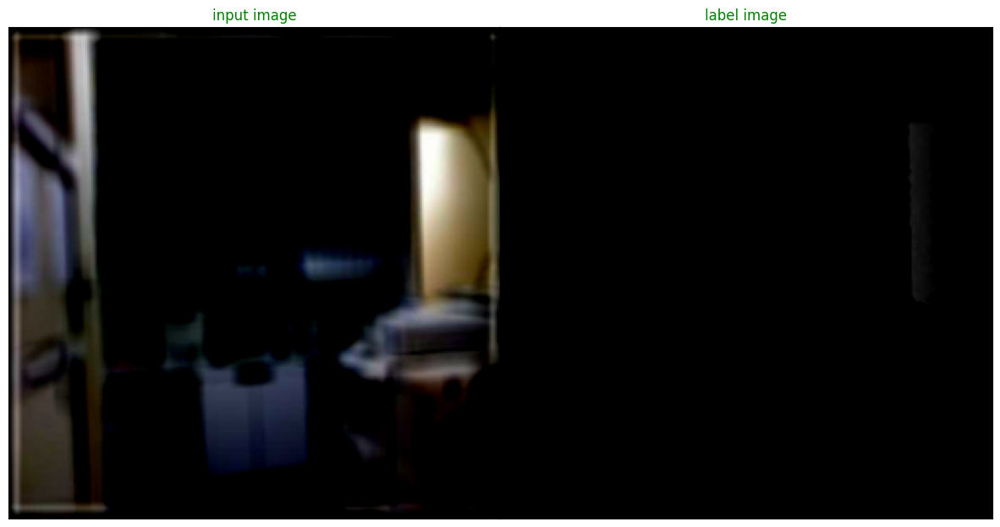

In [ ]:
show_img_sample(x,y)

# Generator Model

In [ ]:
class Block(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, act="relu", use_dropout=False):
        super(Block, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, 2, 1, bias=False, padding_mode="reflect")
            if down
            else nn.ConvTranspose2d(in_channels, out_channels, 4, 2, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU() if act == "relu" else nn.LeakyReLU(0.2),
        )

        self.use_dropout = use_dropout
        self.dropout = nn.Dropout(0.5)
        self.down = down

    def forward(self, x):
        x = self.conv(x)
        return self.dropout(x) if self.use_dropout else x


class Generator(nn.Module):
    def __init__(self, in_channels=3, features=64):
        super().__init__()
        self.initial_down = nn.Sequential(
            nn.Conv2d(in_channels, features, 4, 2, 1, padding_mode="reflect"),
            nn.LeakyReLU(0.2),
        )
        self.down1 = Block(features, features * 2, down=True, act="leaky", use_dropout=False)
        self.down2 = Block(
            features * 2, features * 4, down=True, act="leaky", use_dropout=False
        )
        self.down3 = Block(
            features * 4, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down4 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down5 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down6 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.bottleneck = nn.Sequential(
            nn.Conv2d(features * 8, features * 8, 4, 2, 1), nn.ReLU()
        )

        self.up1 = Block(features * 8, features * 8, down=False, act="relu", use_dropout=True)
        self.up2 = Block(
            features * 8 * 2, features * 8, down=False, act="relu", use_dropout=True
        )
        self.up3 = Block(
            features * 8 * 2, features * 8, down=False, act="relu", use_dropout=True
        )
        self.up4 = Block(
            features * 8 * 2, features * 8, down=False, act="relu", use_dropout=False
        )
        self.up5 = Block(
            features * 8 * 2, features * 4, down=False, act="relu", use_dropout=False
        )
        self.up6 = Block(
            features * 4 * 2, features * 2, down=False, act="relu", use_dropout=False
        )
        self.up7 = Block(features * 2 * 2, features, down=False, act="relu", use_dropout=False)
        self.final_up = nn.Sequential(
            nn.ConvTranspose2d(features * 2, in_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        d1 = self.initial_down(x)
        d2 = self.down1(d1)
        d3 = self.down2(d2)
        d4 = self.down3(d3)
        d5 = self.down4(d4)
        d6 = self.down5(d5)
        d7 = self.down6(d6)
        bottleneck = self.bottleneck(d7)
        up1 = self.up1(bottleneck)
        up2 = self.up2(torch.cat([up1, d7], 1))
        up3 = self.up3(torch.cat([up2, d6], 1))
        up4 = self.up4(torch.cat([up3, d5], 1))
        up5 = self.up5(torch.cat([up4, d4], 1))
        up6 = self.up6(torch.cat([up5, d3], 1))
        up7 = self.up7(torch.cat([up6, d2], 1))
        return self.final_up(torch.cat([up7, d1], 1))

# Discriminator Model

In [ ]:
class ConvBlock(nn.Module):
  def __init__(self,in_channels,out_channels,stride=2):
    super().__init__()
    self.conv_layer=nn.Sequential(
        nn.Conv2d(in_channels,out_channels,4,stride,bias=False,padding_mode='reflect'),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(0.2)
    )
  def forward(self,x):
    return self.conv_layer(x)

In [ ]:
class Discriminator(nn.Module):
  def __init__(self,
               in_channels=3):
    super().__init__()
    self.model=nn.Sequential(
        nn.Conv2d(in_channels*2,64,kernel_size=4,stride=2,padding_mode="reflect",),
        nn.LeakyReLU(0.2),
        ConvBlock(64,128,stride=2),
        ConvBlock(128,256,stride=2),
        ConvBlock(256,512,stride=1),
        nn.Conv2d(512,1,kernel_size=4,stride=1,padding=1,padding_mode="reflect"),
        nn.Sigmoid()
    )
  def forward(self,x,y):
    x=torch.cat([x,y],dim=1)
    return self.model(x)

# Building the Model

In [ ]:
LEARNING_RATE = 2e-4
BATCH_SIZE = 16
NUM_WORKERS = 2
IMAGE_SIZE = 256
CHANNELS_IMG = 3
L1_LAMBDA = 100
LAMBDA_GP = 10
NUM_EPOCHS = 500
LOAD_MODEL = False
SAVE_MODEL = False
CHECKPOINT_DISC = "disc.pth.tar"
CHECKPOINT_GEN = "gen.pth.tar"

In [ ]:
# g_loss=[]
# d_loss=[]

In [ ]:
def train_fn(train_dl, G, D, criterion_bce, criterion_mae, optimizer_g, optimizer_d):
    G.train()
    D.train()
    LAMBDA=100.0
    total_g_loss=[]
    total_d_loss=[]
    for i,(input_image,real_image) in enumerate(tqdm(train_dl)):
        input_image=input_image.to(device)
        real_image=real_image.to(device)

        real_label=torch.ones(input_image.size()[0],1,26,26).to(device)
        fake_label=torch.zeros(input_image.size()[0], 1, 26, 26).to(device)
        # Generator
        fake_img=G(input_image)
        # fake_img_ = fake_img.detach()
        out_fake = D(fake_img, input_image)
        loss_g_bce = criterion_bce(out_fake, real_label)
        loss_g_mae = criterion_mae(fake_img, real_image)
        loss_g = loss_g_bce + LAMBDA * loss_g_mae
        total_loss_g.append(loss_g.item())

        optimizer_g.zero_grad()
        optimizer_d.zero_grad()
        loss_g.backward()
        optimizer_g.step()
        # Dicriminator
        out_real=D(real_image,input_image)
        loss_d_real=criterion_bce(out_real, real_label)
        out_fake = D(fake_img_, input_image)
        loss_d_fake = criterion_bce(out_fake, fake_label)
        loss_d = loss_d_real + loss_d_fake
        total_loss_d.append(loss_d.item())

        optimizer_g.zero_grad()
        optimizer_d.zero_grad()
        loss_d.backward()
        optimizer_d.step()
    return mean(total_loss_g), mean(total_loss_d), fake_img.detach().cpu()

In [ ]:
def save_img(fake_img, e):
    os.makedirs("generated", exist_ok=True)
    save_image(fake_img, f"generated/fake{str(e)}.png", range=(-1.0, 1.0), normalize=True)

In [ ]:
def save_logs(result):
    with open("train.pkl", "wb") as f:
        pickle.dump([result], f)

In [ ]:
def save_model(D, G, e):
    os.makedirs("weight", exist_ok=True)
    torch.save(G.state_dict(), f"weight/G{str(e+1)}.pth")
    torch.save(D.state_dict(), f"weight/D{str(e+1)}.pth")

In [ ]:
def show_losses(g, d):
    fig, axes = plt.subplots(1, 2, figsize=(14,6))
    ax = axes.ravel()
    ax[0].plot(np.arange(len(g)).tolist(), g)
    ax[0].set_title("Generator Loss")
    ax[1].plot(np.arange(len(d)).tolist(), d)
    ax[1].set_title("Discriminator Loss")
    plt.show()

# Training the Model

In [ ]:
G=Generator()
D=Discriminator()

In [ ]:
EPOCHS = 200
betas=(0.5, 0.999)
lr=0.002
BATCH_SIZE=16

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
print(device)

cuda


In [ ]:
G.to(device)
D.to(device)
train_dl = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True,num_workers=2)
optimizer_g = torch.optim.Adam(G.parameters(), lr=lr, betas=betas)
optimizer_d = torch.optim.Adam(D.parameters(), lr=lr, betas=betas)
criterion_mae = nn.L1Loss()
criterion_bce = nn.BCEWithLogitsLoss()
total_loss_d, total_loss_g = [], []
result = {}

In [ ]:
for epoch in range(EPOCHS):
    print("EPOCH: ",epoch+1)
    loss_g,loss_d,fake_img=train_fn(train_dl,G,D,criterion_bce,criterion_mae,optimizer_g,optimizer_d)
    total_loss_d.append(loss_d)
    total_loss_g.append(loss_g)
    save_img(fake_img,epoch+1)
    if epoch%10==0:
        save_model(D,G,epoch)

EPOCH:  1


100%|██████████| 84/84 [00:53<00:00,  1.58it/s]


EPOCH:  2


100%|██████████| 84/84 [00:45<00:00,  1.84it/s]


EPOCH:  3


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  4


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  5


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  6


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  7


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  8


100%|██████████| 84/84 [00:52<00:00,  1.62it/s]


EPOCH:  9


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  10


100%|██████████| 84/84 [00:47<00:00,  1.79it/s]


EPOCH:  11


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  12


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  13


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  14


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  15


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  16


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  17


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  18


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  19


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  20


100%|██████████| 84/84 [00:48<00:00,  1.75it/s]


EPOCH:  21


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  22


100%|██████████| 84/84 [00:46<00:00,  1.82it/s]


EPOCH:  23


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  24


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  25


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  26


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  27


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  28


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  29


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  30


100%|██████████| 84/84 [00:47<00:00,  1.75it/s]


EPOCH:  31


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  32


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  33


100%|██████████| 84/84 [00:46<00:00,  1.82it/s]


EPOCH:  34


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  35


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  36


100%|██████████| 84/84 [00:47<00:00,  1.75it/s]


EPOCH:  37


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  38


100%|██████████| 84/84 [00:48<00:00,  1.75it/s]


EPOCH:  39


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  40


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  41


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  42


100%|██████████| 84/84 [00:47<00:00,  1.75it/s]


EPOCH:  43


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  44


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  45


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  46


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  47


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  48


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  49


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  50


100%|██████████| 84/84 [00:48<00:00,  1.75it/s]


EPOCH:  51


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  52


100%|██████████| 84/84 [00:49<00:00,  1.70it/s]


EPOCH:  53


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  54


100%|██████████| 84/84 [00:48<00:00,  1.75it/s]


EPOCH:  55


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  56


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  57


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  58


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  59


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  60


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  61


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  62


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  63


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  64


100%|██████████| 84/84 [00:48<00:00,  1.75it/s]


EPOCH:  65


100%|██████████| 84/84 [00:46<00:00,  1.82it/s]


EPOCH:  66


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  67


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  68


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  69


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  70


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  71


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  72


100%|██████████| 84/84 [00:47<00:00,  1.75it/s]


EPOCH:  73


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  74


100%|██████████| 84/84 [00:47<00:00,  1.75it/s]


EPOCH:  75


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  76


100%|██████████| 84/84 [00:48<00:00,  1.75it/s]


EPOCH:  77


100%|██████████| 84/84 [00:46<00:00,  1.82it/s]


EPOCH:  78


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  79


100%|██████████| 84/84 [00:46<00:00,  1.82it/s]


EPOCH:  80


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  81


100%|██████████| 84/84 [00:46<00:00,  1.82it/s]


EPOCH:  82


100%|██████████| 84/84 [00:46<00:00,  1.82it/s]


EPOCH:  83


100%|██████████| 84/84 [00:47<00:00,  1.79it/s]


EPOCH:  84


100%|██████████| 84/84 [00:46<00:00,  1.82it/s]


EPOCH:  85


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  86


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  87


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  88


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  89


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  90


100%|██████████| 84/84 [00:46<00:00,  1.82it/s]


EPOCH:  91


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  92


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  93


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  94


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  95


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  96


100%|██████████| 84/84 [00:46<00:00,  1.82it/s]


EPOCH:  97


100%|██████████| 84/84 [00:50<00:00,  1.67it/s]


EPOCH:  98


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  99


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  100


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  101


100%|██████████| 84/84 [00:49<00:00,  1.70it/s]


EPOCH:  102


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  103


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  104


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  105


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  106


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  107


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  108


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  109


100%|██████████| 84/84 [00:48<00:00,  1.73it/s]


EPOCH:  110


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  111


100%|██████████| 84/84 [00:47<00:00,  1.75it/s]


EPOCH:  112


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  113


100%|██████████| 84/84 [00:48<00:00,  1.75it/s]


EPOCH:  114


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  115


100%|██████████| 84/84 [00:47<00:00,  1.75it/s]


EPOCH:  116


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  117


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  118


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  119


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  120


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  121


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  122


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  123


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  124


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  125


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  126


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  127


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  128


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  129


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  130


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  131


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  132


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  133


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  134


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  135


100%|██████████| 84/84 [00:49<00:00,  1.71it/s]


EPOCH:  136


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  137


100%|██████████| 84/84 [00:48<00:00,  1.75it/s]


EPOCH:  138


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  139


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  140


100%|██████████| 84/84 [00:46<00:00,  1.81it/s]


EPOCH:  141


100%|██████████| 84/84 [00:47<00:00,  1.75it/s]


EPOCH:  142


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  143


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  144


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  145


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  146


100%|██████████| 84/84 [00:46<00:00,  1.82it/s]


EPOCH:  147


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  148


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  149


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  150


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  151


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  152


100%|██████████| 84/84 [00:47<00:00,  1.79it/s]


EPOCH:  153


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  154


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  155


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  156


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  157


100%|██████████| 84/84 [00:52<00:00,  1.60it/s]


EPOCH:  158


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  159


100%|██████████| 84/84 [00:48<00:00,  1.73it/s]


EPOCH:  160


100%|██████████| 84/84 [00:48<00:00,  1.72it/s]


EPOCH:  161


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  162


100%|██████████| 84/84 [00:47<00:00,  1.75it/s]


EPOCH:  163


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  164


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  165


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  166


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  167


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  168


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  169


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  170


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  171


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  172


100%|██████████| 84/84 [00:47<00:00,  1.79it/s]


EPOCH:  173


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  174


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  175


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  176


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  177


100%|██████████| 84/84 [00:48<00:00,  1.75it/s]


EPOCH:  178


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  179


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  180


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  181


100%|██████████| 84/84 [00:48<00:00,  1.75it/s]


EPOCH:  182


100%|██████████| 84/84 [00:49<00:00,  1.70it/s]


EPOCH:  183


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  184


100%|██████████| 84/84 [00:48<00:00,  1.73it/s]


EPOCH:  185


100%|██████████| 84/84 [00:47<00:00,  1.76it/s]


EPOCH:  186


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  187


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


EPOCH:  188


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  189


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  190


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  191


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  192


100%|██████████| 84/84 [00:46<00:00,  1.79it/s]


EPOCH:  193


100%|██████████| 84/84 [00:48<00:00,  1.75it/s]


EPOCH:  194


100%|██████████| 84/84 [00:47<00:00,  1.79it/s]


EPOCH:  195


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  196


100%|██████████| 84/84 [00:47<00:00,  1.77it/s]


EPOCH:  197


100%|██████████| 84/84 [00:48<00:00,  1.74it/s]


EPOCH:  198


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  199


100%|██████████| 84/84 [00:47<00:00,  1.78it/s]


EPOCH:  200


100%|██████████| 84/84 [00:46<00:00,  1.80it/s]


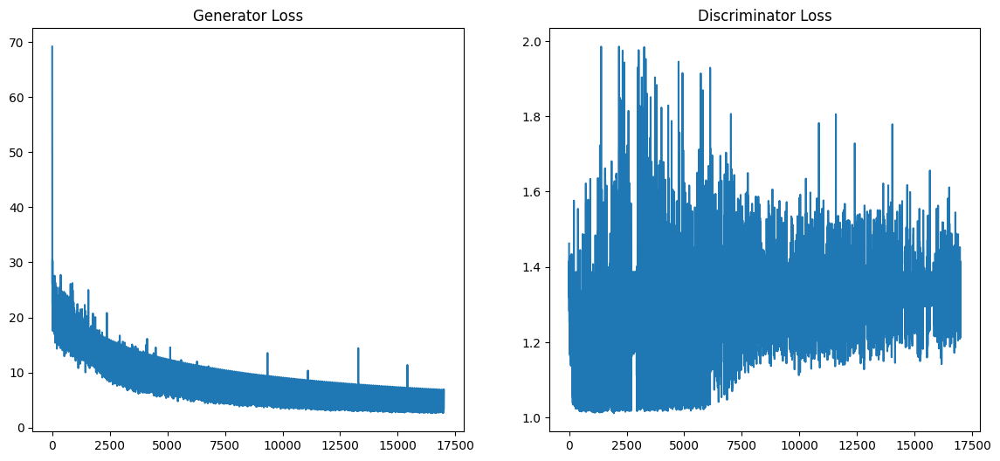

In [ ]:
result["G"] = total_loss_d
result["D"] = total_loss_g
#sssjjgg
# saving_logs(result)
show_losses(total_loss_g, total_loss_d)
# saving_model(D, G, e)
# print("successfully save model")
# return G, D

In [ ]:
import pickle

In [ ]:
save_logs(result)

In [ ]:
save_model(D,G,200)

In [ ]:
def train_show_img(name, G):
#     G = load_model(name)
    root = "generated"
    fig, axes = plt.subplots(int(name), 1, figsize=(12, 18))
    ax = axes.ravel()
    for i in range(int(name)):
        filename = os.path.join(root, f"fake{str(i+1)}.png")
        ax[i].imshow(Image.open(filename))
        ax[i].set_xticks([])
        ax[i].set_yticks([])


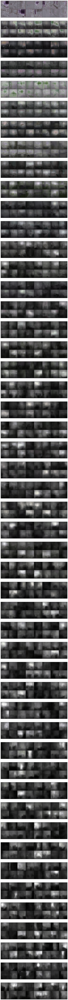

In [ ]:
train_show_img(5, G)

In [ ]:
MEAN = (0.5, 0.5, 0.5,)
STD = (0.5, 0.5, 0.5,)

In [ ]:
def load_model(name):
    G = Generator()
    G.load_state_dict(torch.load(f"weight/G{name}.pth", map_location={"cuda:0": "cpu"}))
    G.eval()
    return G.to(device)

In [ ]:
G = Generator()
G.load_state_dict(torch.load(f"/content/drive/MyDrive/G201.pth", map_location={"cuda:0": "cpu"}))
G.eval()
G.to("cpu")

Generator(
  (initial_down): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), padding_mode=reflect)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (down1): Block(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, padding_mode=reflect)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (dropout): Dropout(p=0.5, inplace=False)
  )
  (down2): Block(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, padding_mode=reflect)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (dropout): Dropout(p=0.5, inplace=False)
  )
  (down3): Block(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, pa

In [ ]:
def de_norm(img):
    img_ = img.mul(torch.FloatTensor(STD).view(3, 1, 1))
    img_ = img_.add(torch.FloatTensor(MEAN).view(3, 1, 1)).detach().numpy()
    img_ = np.transpose(img_, (1, 2, 0))
    return img_

def evaluate(val_dl, name, G):
    with torch.no_grad():
        fig, axes = plt.subplots(6, 8, figsize=(12, 12))
        ax = axes.ravel()
#         G = load_model(name)
        for input_img, real_img in tqdm(val_dl):
            input_img = input_img.to("cpu")
            real_img = real_img.to("cpu")

            fake_img = G(input_img)
            batch_size = input_img.size()[0]
            batch_size_2 = batch_size * 2

            for i in range(batch_size):
                ax[i].imshow(input_img[i].permute(1, 2, 0))
                ax[i+batch_size].imshow(de_norm(real_img[i]))
                ax[i+batch_size_2].imshow(de_norm(fake_img[i]))
                ax[i].set_xticks([])
                ax[i].set_yticks([])
                ax[i+batch_size].set_xticks([])
                ax[i+batch_size].set_yticks([])
                ax[i+batch_size_2].set_xticks([])
                ax[i+batch_size_2].set_yticks([])
                if i == 0:
                    ax[i].set_ylabel("Input Image", c="g")
                    ax[i+batch_size].set_ylabel("Real Image", c="g")
                    ax[i+batch_size_2].set_ylabel("Generated Image", c="r")
            plt.subplots_adjust(wspace=0, hspace=0)
            break

  0%|          | 0/84 [00:08<?, ?it/s]


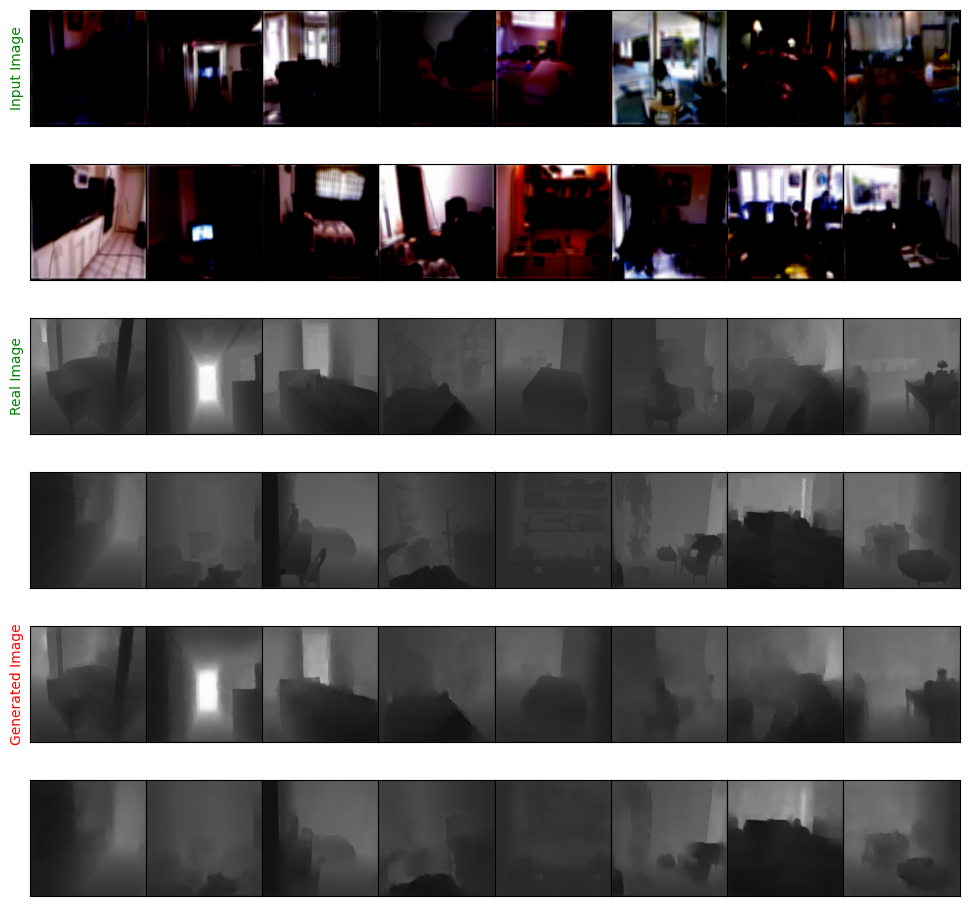

In [ ]:
evaluate(train_dl, 5, G)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
G.to(device)
D.to(device)
train_dl = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True,num_workers=2)
optimizer_g = torch.optim.Adam(G.parameters(), lr=lr, betas=betas)
optimizer_d = torch.optim.Adam(D.parameters(), lr=lr, betas=betas)
criterion_mae = nn.L1Loss()
criterion_bce = nn.BCEWithLogitsLoss()
total_loss_d, total_loss_g = [], []
result = {}

In [ ]:
for epoch in range(200,300):
    print("EPOCH: ",epoch+1)
    loss_g,loss_d,fake_img=train_fn(train_dl,G,D,criterion_bce,criterion_mae,optimizer_g,optimizer_d)
    total_loss_d.append(loss_d)
    total_loss_g.append(loss_g)
    save_img(fake_img,epoch+1)
    if epoch%10==0:
        save_model(D,G,epoch)